# Visualizing what CNN learn

It is often said that deep learning models are "black boxes", learning representations that are difficult to extract and present in a human-readable form. While this is partially true for certain types of deep learning models, **it is definitely not true for CNNs**. The representations learned by convnets are highly amenable to visualization, in large part because **they are representations of visual concepts**. Since 2013, a wide array of techniques have been developed for visualizing and interpreting these representations. The following are three of the most accessible and useful ones:

- **Visualizing intermediate convnet outputs ("intermediate activations")**. This is useful to understand how successive convnet layers transform their input, and to get a first idea of the meaning of individual convnet filters.
- **Visualizing convnets filters**. This is useful to understand precisely what visual pattern or concept each filter in a convnet is receptive to.
- **Visualizing heatmaps of class activation in an image**. This is useful to understand which part of an image where identified as belonging to a given class, and thus allows to localize objects in images.

## Visualizing intermediate activations

Visualizing intermediate activations consists in displaying the feature maps that are output by various convolution and pooling layers in a network, given a certain input (the output of a layer is often called its "activation", the output of the activation function). This gives a view into how an input is decomposed unto the different filters learned by the network. These feature maps we want to visualize have 3 dimensions: width, height, and depth (channels). Each channel encodes relatively independent features, so the proper way to visualize these feature maps is by independently plotting the contents of every channel, as a 2D image.

Let's start using the first small CNN trained in the last notebook.

In [1]:
from tensorflow.keras.models import load_model

model = load_model('models/cats_and_dogs_small_2.h5')
model.summary()

Model: "sequential_9"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
conv2d_36 (Conv2D)           (None, 148, 148, 32)      896       
_________________________________________________________________
max_pooling2d_36 (MaxPooling (None, 74, 74, 32)        0         
_________________________________________________________________
conv2d_37 (Conv2D)           (None, 72, 72, 64)        18496     
_________________________________________________________________
max_pooling2d_37 (MaxPooling (None, 36, 36, 64)        0         
_________________________________________________________________
conv2d_38 (Conv2D)           (None, 34, 34, 128)       73856     
_________________________________________________________________
max_pooling2d_38 (MaxPooling (None, 17, 17, 128)       0         
_________________________________________________________________
conv2d_39 (Conv2D)           (None, 15, 15, 128)      

#### Choose an image from test dataset

An image not used for _training_ the data. Note that also `target_size` and last transofmation are coherent with data preprocessing of the choosen model.

In [2]:
import numpy as np
from tensorflow.keras.preprocessing import image

IMG_PATH = './datasets/cats_and_dogs_small/test/cats/cat.1700.jpg'

img = image.load_img(IMG_PATH, target_size=(150, 150))
img_tensor = image.img_to_array(img)
img_tensor = np.expand_dims(img_tensor, axis=0)
img_tensor /= 255 # Same transformation made by generators

print(img_tensor.shape)

(1, 150, 150, 3)


#### Display the chosen picture

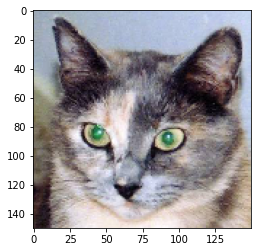

In [3]:
import matplotlib.pyplot as plt

plt.imshow(img_tensor[0])
plt.show()

#### Build an activation extractor model

What's needed is a model that takes batches of images as input and returns the activations of all convolution and pooling layers. In Keras:

In [4]:
from tensorflow.keras import models

layer_outputs = [layer.output for layer in model.layers[:8]] # take the output of the 8 layers on top of the network
activation_model = models.Model(inputs=model.input, outputs=layer_outputs)

Using the model in prediction mode will return a list of numpy tensors equal to the number of activations. 8 in this case.

In [5]:
activations = activation_model.predict(img_tensor)
len(activations)

8

As an example, the first output should return a numpy tensor of shape `148, 148, 132`, as specified by the `model.summary()` function

In [6]:
first_activation = activations[0]
first_activation.shape

(1, 148, 148, 32)

#### Displaying activations

Let's try plotting the first channel of the first activation we just found:

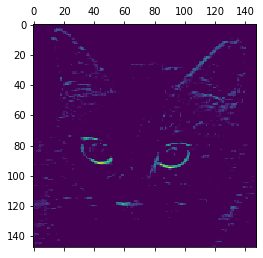

In [7]:
plt.matshow(first_activation[0, :, :, 1], cmap='viridis')

This filter looks like a `bright green dot`, useful for cat eyes

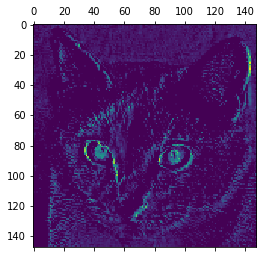

In [8]:
plt.matshow(first_activation[0, :, :, 10], cmap='viridis')

This one instead looks more like a diagonal edge detector. At this point we can plot a more general visualization of all actovations in the network.

/Users/lucaballore/.anaconda3/envs/dl-python/lib/python3.6/site-packages/ipykernel_launcher.py:28: RuntimeWarning: invalid value encountered in true_divide


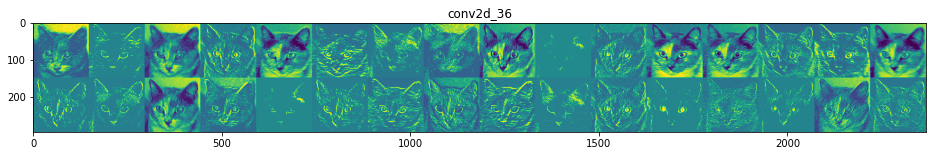

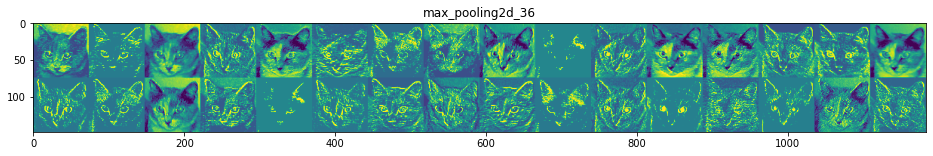

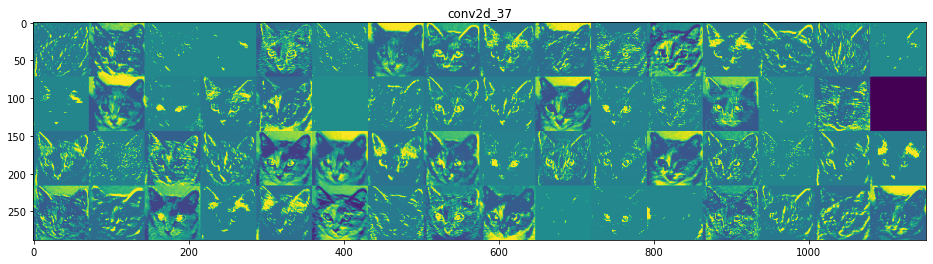

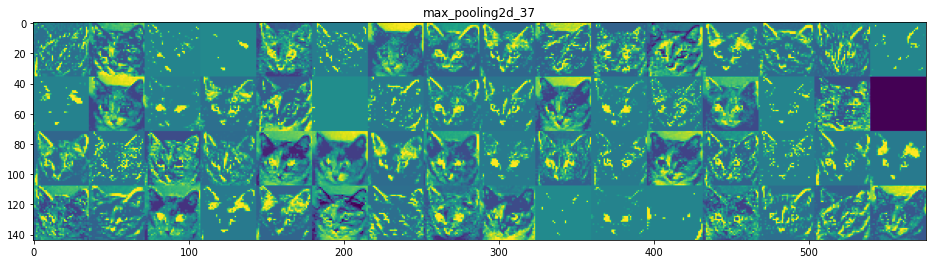

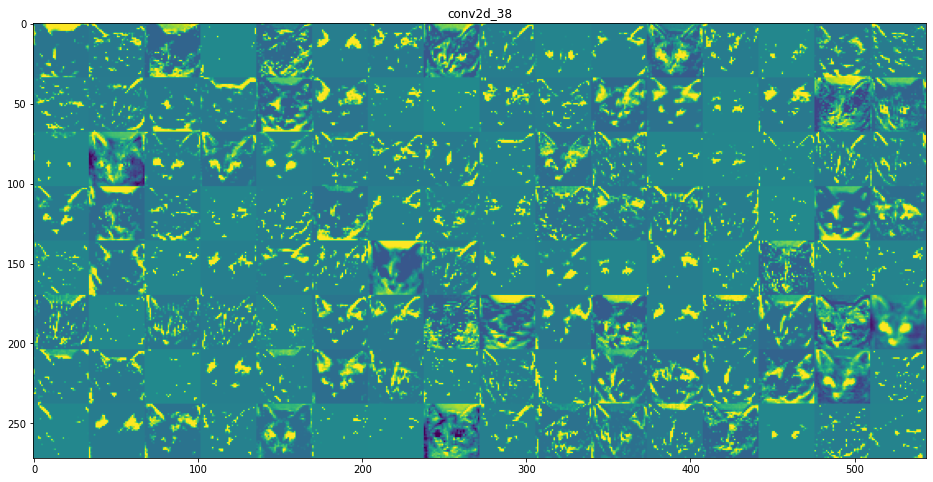

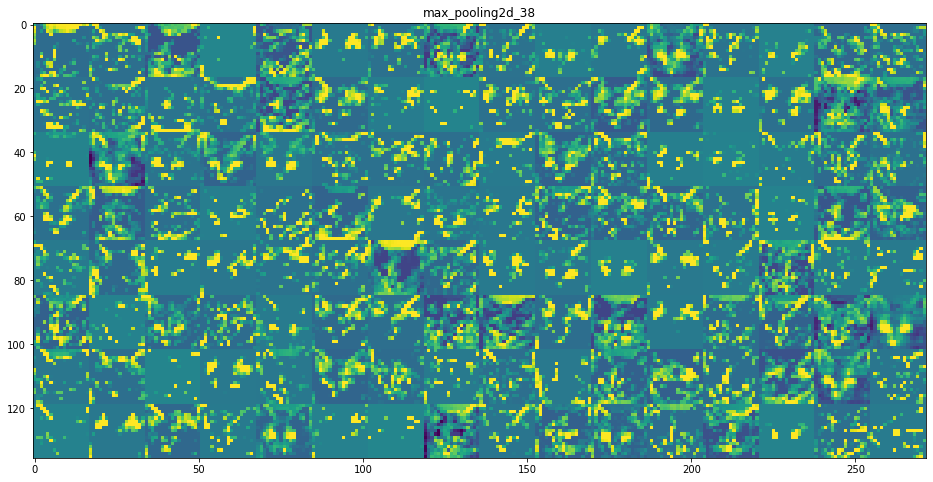

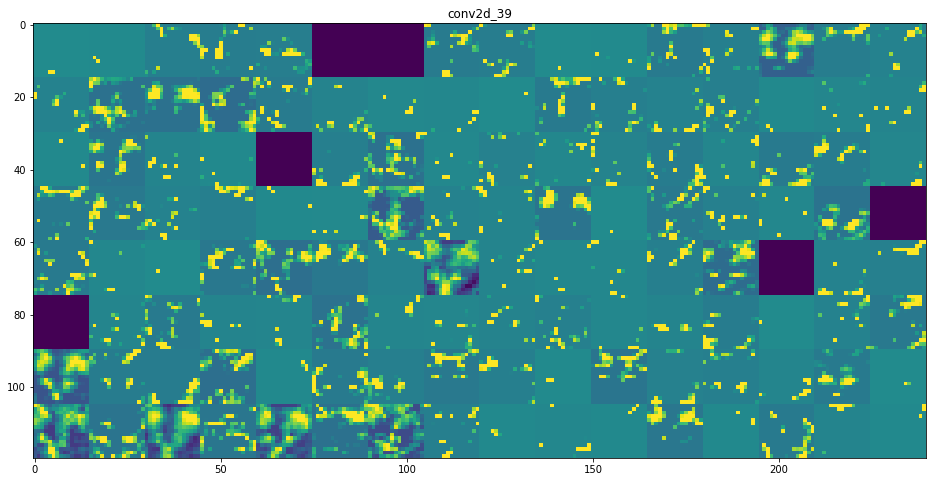

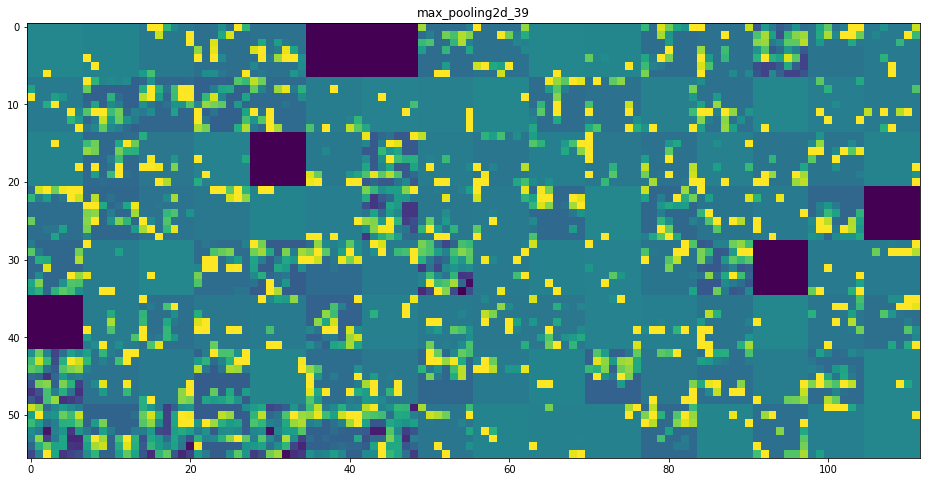

In [9]:
# These are the names of the layers, so can have them as part of our plot
layer_names = []
for layer in model.layers[:8]:
    layer_names.append(layer.name)

images_per_row = 16

# Now let's display our feature maps
for layer_name, layer_activation in zip(layer_names, activations):
    # This is the number of features in the feature map
    n_features = layer_activation.shape[-1]

    # The feature map has shape (1, size, size, n_features)
    size = layer_activation.shape[1]

    # We will tile the activation channels in this matrix
    n_cols = n_features // images_per_row
    display_grid = np.zeros((size * n_cols, images_per_row * size))

    # We'll tile each filter into this big horizontal grid
    for col in range(n_cols):
        for row in range(images_per_row):
            channel_image = layer_activation[0,
                                             :, :,
                                             col * images_per_row + row]
            # Post-process the feature to make it visually palatable
            channel_image -= channel_image.mean()
            channel_image /= channel_image.std()
            channel_image *= 64
            channel_image += 128
            channel_image = np.clip(channel_image, 0, 255).astype('uint8')
            display_grid[col * size : (col + 1) * size,
                         row * size : (row + 1) * size] = channel_image

    # Display the grid
    scale = 1. / size
    plt.figure(figsize=(scale * display_grid.shape[1],
                        scale * display_grid.shape[0]))
    plt.title(layer_name)
    plt.grid(False)
    plt.imshow(display_grid, aspect='auto', cmap='viridis')
    
plt.show()

Note that:
- The first layer acts as a collection of various edge detectors. At that stage, the activations are still retaining almost all of the information present in the initial picture.
- As we go higher-up, the activations become increasingly abstract and less visually interpretable. They start encoding higher-level concepts such as "cat ear" or "cat eye". Higher-up presentations carry increasingly less information about the visual contents of the image, and increasingly more information related to the class of the image.
- The sparsity of the activations is increasing with the depth of the layer: in the first layer, all filters are activated by the input image, but in the following layers more and more filters are blank. This means that the pattern encoded by the filter isn't found in the input image.

The features extracted by a layer get **increasingly abstract with the depth of the layer**. The activations of layers higher-up carry less and less information about the specific input being seen, and more and more information about the target (in our case, the class of the image: cat or dog). A deep neural network effectively acts as an information distillation pipeline, with raw data going in (in our case, RBG pictures), and getting repeatedly transformed so that irrelevant information gets filtered out (e.g. the specific visual appearance of the image) while useful information get magnified and refined (e.g. the class of the image).

This is analogous to the way humans and animals perceive the world: after observing a scene for a few seconds, a human can remember which abstract objects were present in it (e.g. bicycle, tree) but could not remember the specific appearance of these objects.

### Visualizing convnet filters

Another easy way to inspect the filters learned by CNNs is to display the visual pattern that each filter is meant to respond to. We'll build a loss function that maximizes the value of a given filter in a given convolutional layer, then we'll use a stochastic gradient descent to adjust the values of the input image so as to maximize the activation value.

In Tensorflow 2.0/Keras, the implementation of this method is only 4 steps:
- perform the initial subgraph creation (same as before);
- use the GradientTape object to capture the gradients on the input;
- get the gradients with tape.gradient;
- perform the gradient ascent with assign_add on the initial variable.

For instance, let's see the loss for the activation filter `0` in the layer `block3_conv1` of the VGG16 network.

In [10]:
import tensorflow as tf
from tensorflow.keras.applications import VGG16, vgg16
from tensorflow.keras import backend as K
from tensorflow.keras.applications.vgg16 import preprocess_input
from tensorflow.keras import layers, preprocessing

model = VGG16(weights='imagenet', include_top=False)
model.summary()

Model: "vgg16"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
input_1 (InputLayer)         [(None, None, None, 3)]   0         
_________________________________________________________________
block1_conv1 (Conv2D)        (None, None, None, 64)    1792      
_________________________________________________________________
block1_conv2 (Conv2D)        (None, None, None, 64)    36928     
_________________________________________________________________
block1_pool (MaxPooling2D)   (None, None, None, 64)    0         
_________________________________________________________________
block2_conv1 (Conv2D)        (None, None, None, 128)   73856     
_________________________________________________________________
block2_conv2 (Conv2D)        (None, None, None, 128)   147584    
_________________________________________________________________
block2_pool (MaxPooling2D)   (None, None, None, 128)   0     

In [11]:
# Define the size and produce a random grey image with some noise, then cast it to a tensor of float32
size = 150
img_tensor = np.random.random((1, size, size, 3)) * 20 + 128.
img_tensor = tf.Variable(tf.cast(img_tensor, tf.float32))

# Specify the convolution layer and the filter we want to connect to
conv_layer = model.get_layer("block3_conv1")
filter_index = 0
step_size = 1

# Create a connection between the input and the target layer
submodel = tf.keras.models.Model([model.inputs[0]], [conv_layer.output])

# In this case we run gradient ascent only once as an example
with tf.GradientTape() as tape:
    outputs = submodel(img_tensor)
    loss_value = tf.reduce_mean(outputs[:, :, :, filter_index])
    
# Get the gradients with tape.gradient
grads = tape.gradient(loss_value, img_tensor)

A non obvious trick to use to help the gradient descent process go smoothly is to normalize the gradient tensor by dividing it by its L2 norm (the square root ocf the average of the square of the values in the tensor). This ensures that the magnitude of the updates done to the input image is always within the same range.

After the normalization, we can perform the gradient ascent with `assign_add` on the initial variable. We should obtain a tensor of shape `(1, size, size, 3)`

In [12]:
normalized_grads = \
    grads / (tf.sqrt(tf.reduce_mean(tf.square(grads))) + 1e-5) # Add a small costant at the end to avoid divisions by 0

img_tensor.assign_add(normalized_grads * step_size)
img_tensor.shape

TensorShape([1, 150, 150, 3])

Now we have all we need for getting the patterns from all the layers and filters. Let's put all together in a function: 

In [13]:
def generate_pattern(layer_name, filter_index, size=150):
    img_tensor = np.random.random((1, size, size, 3)) * 20 + 128.
    img_tensor = tf.Variable(tf.cast(img_tensor, tf.float32))
    
    conv_layer = model.get_layer(layer_name)
    step_size = 1

    submodel = tf.keras.models.Model([model.inputs[0]], [conv_layer.output])

    # Run gradient ascent for 40 steps
    for _ in range(40):
        with tf.GradientTape() as tape:
            outputs = submodel(img_tensor)
            loss_value = tf.reduce_mean(outputs[:, :, :, filter_index])

        grads = tape.gradient(loss_value, img_tensor)
        normalized_grads = grads / (tf.sqrt(tf.reduce_mean(tf.square(grads))) + 1e-5)
        img_tensor.assign_add(normalized_grads * step_size)
    
    # Convert values input data to the valid range for imshow with RGB data ([0..255] for integers)
    img = img_tensor[0].numpy().astype(np.uint8) 
    
    return img

Display the response. It seems that filter 0 in layer `block3_conv1` is responsive to a *polka dot pattern*.

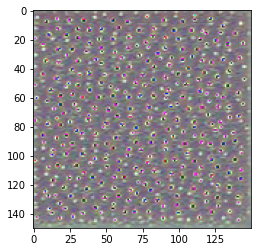

In [14]:
plt.imshow(generate_pattern('block3_conv1', 0))
plt.show()

#### Visualize all filters in all layers

Now the fun part: we can start visualising every single filter in every layer. For simplicity, we will only look at the first 64 filters in each layer, and will only look at the first layer of each convolution block (block1_conv1, block2_conv1, block3_conv1, block4_conv1, block5_conv1). We will arrange the outputs on a 8x8 grid of 64x64 filter patterns, with some black margins between each filter pattern.

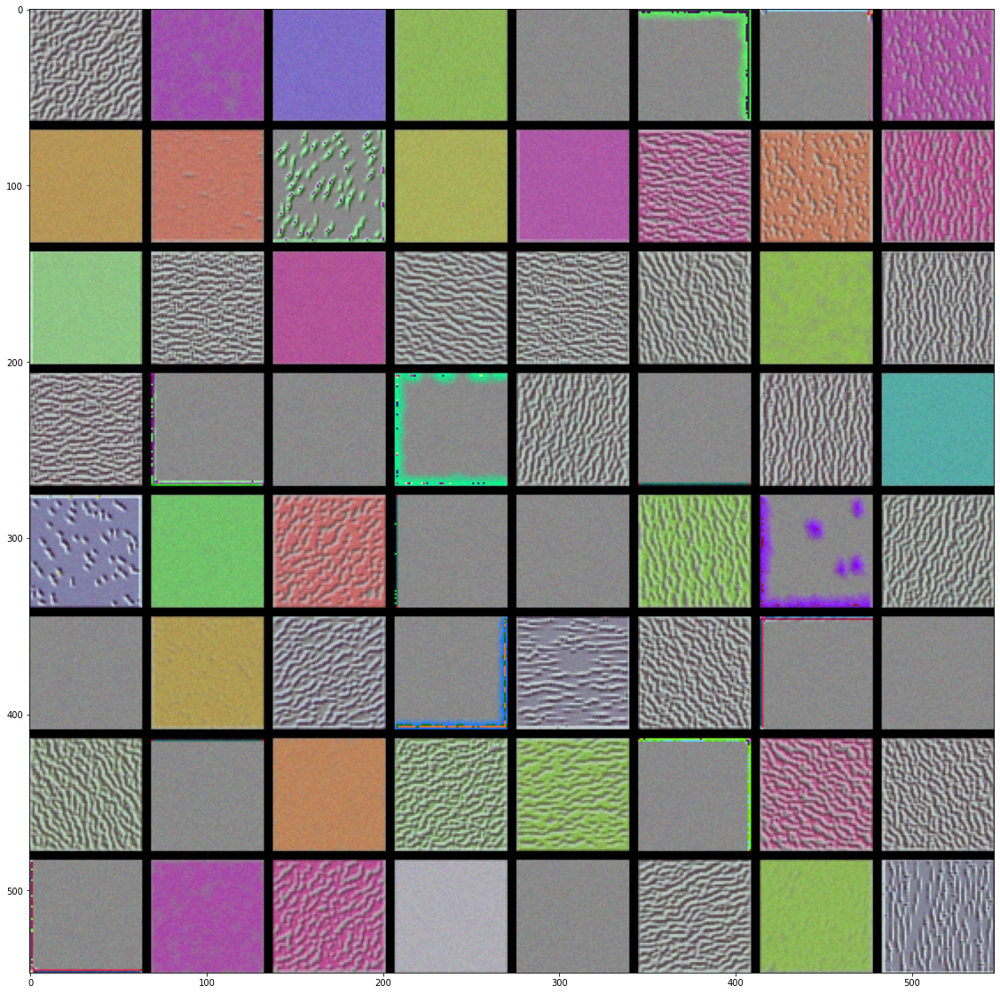

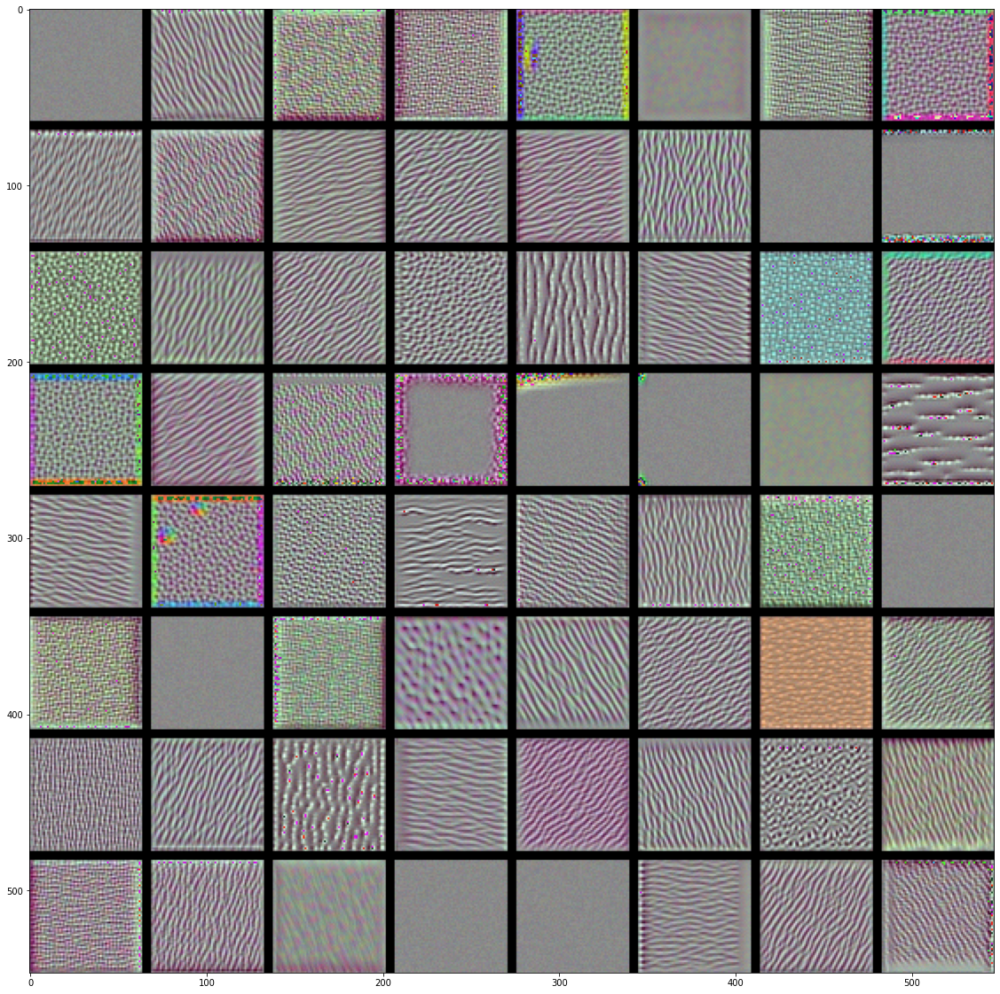

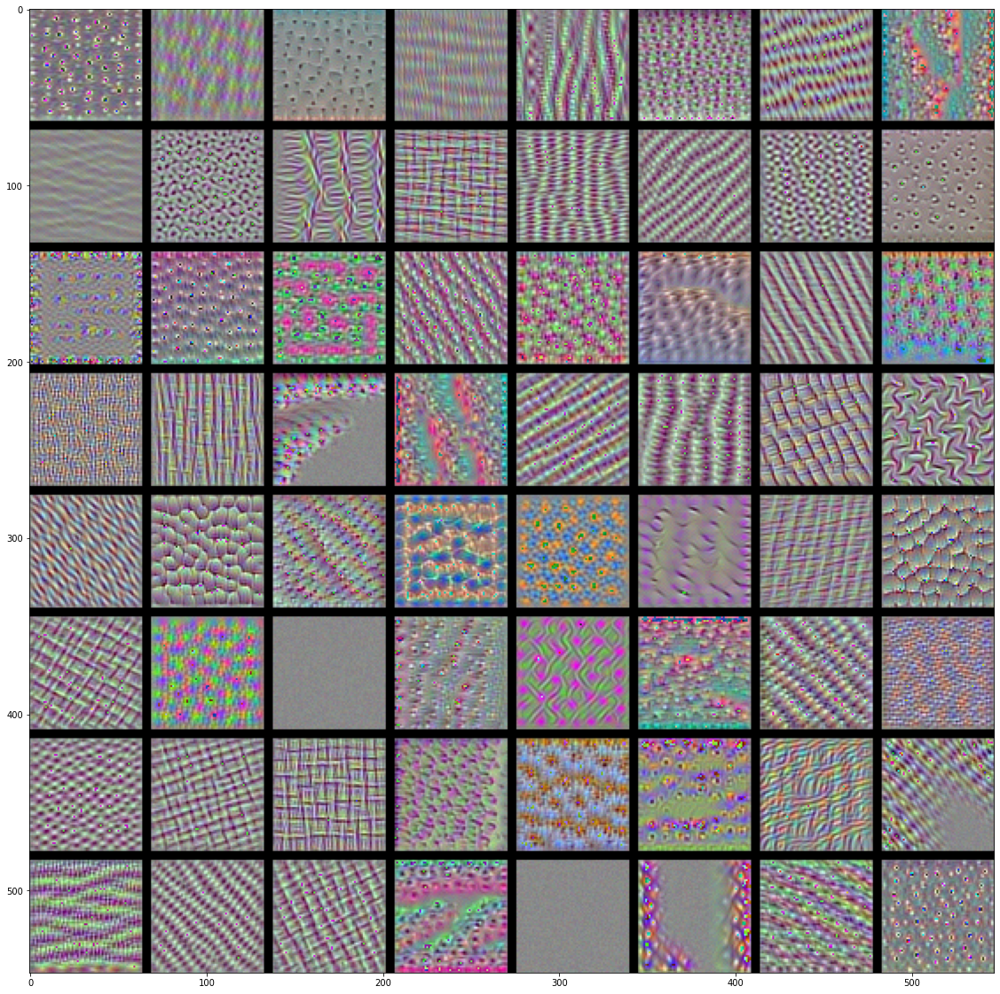

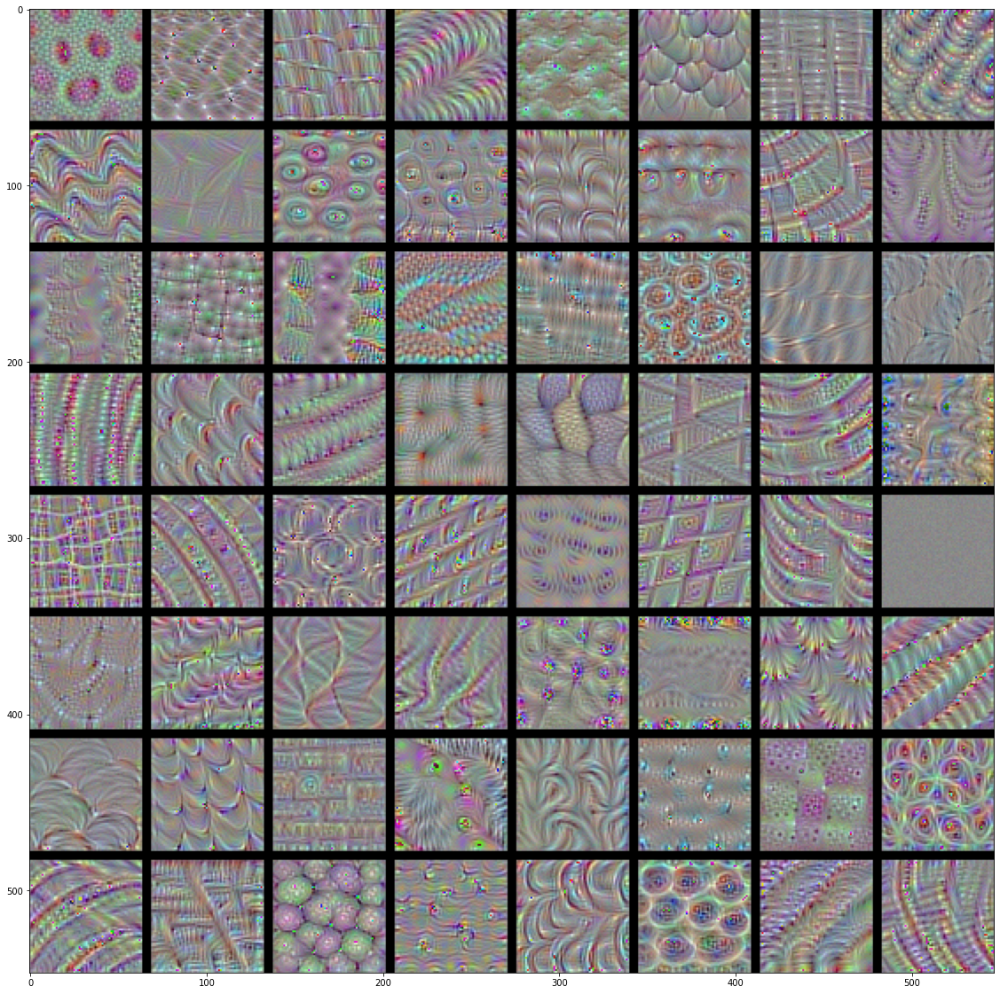

In [15]:
for layer_name in ['block1_conv1', 'block2_conv1', 'block3_conv1', 'block4_conv1']:
    size = 64
    margin = 5

    # This a empty (black) image where we will store our results.
    results = np.zeros((8 * size + 7 * margin, 8 * size + 7 * margin, 3)).astype(np.uint8)

    for i in range(8):  # iterate over the rows of our results grid
        for j in range(8):  # iterate over the columns of our results grid
            # Generate the pattern for filter `i + (j * 8)` in `layer_name`
            filter_img = generate_pattern(layer_name, i + (j * 8), size=size)

            # Put the result in the square `(i, j)` of the results grid
            horizontal_start = i * size + i * margin
            horizontal_end = horizontal_start + size
            vertical_start = j * size + j * margin
            vertical_end = vertical_start + size
            results[horizontal_start: horizontal_end, vertical_start: vertical_end, :] = filter_img

    # Display the results grid
    plt.figure(figsize=(20, 20))
    plt.imshow(results)
    plt.show()

These filter visualizations tell us a lot about how convnet layers see the world: **each layer in a convnet simply learns a collection of filters such that their inputs can be expressed as a combination of the filters**. This is similar to how the Fourier transform decomposes signals onto a bank of cosine functions. The filters in these convnet filter banks get increasingly complex and refined as we go higher-up in the model:

- The filters from the first layer in the model (block1_conv1) encode simple directional edges and colors (or colored edges in some cases).
- The filters from block2_conv1 encode simple textures made from combinations of edges and colors.
- The filters in higher-up layers start resembling textures found in natural images: feathers, eyes, leaves, etc.

### Visualizing heatmaps of class activation

This technique is helpful for "debugging" the decision process of a convnet, in particular in case of a classification mistake. It also allows you to locate specific objects in an image.

This general category of techniques is called **Class Activation Map (CAM) visualization**, and consists in producing heatmaps of "class activation" over input images. A "class activation" heatmap is a 2D grid of scores associated with an specific output class, computed for every location in any input image, indicating **how important each location is with respect to the class considered**. For instance, given a image fed into one of our "cat vs. dog" convnet, Class Activation Map visualization allows us to generate a heatmap for the class "cat", indicating how cat-like different parts of the image are, and likewise for the class "dog", indicating how dog-like differents parts of the image are.

The specific implementation we will use is the one described in [Grad-CAM: Why did you say that? Visual Explanations from Deep Networks via Gradient-based Localization](https://arxiv.org/abs/1610.02391). 
It consists in taking the output feature map of a convolution layer given an input image, and weighing every channel in that feature map by the gradient of the class with respect to the channel. Intuitively, one way to understand this trick is that we are weighting a spatial map of "how intensely the input image activates different channels" by "how important each channel is with regard to the class", resulting in a spatial map of "how intensely the input image activates the class".

We will demonstrate this technique using the pre-trained VGG16 network again:

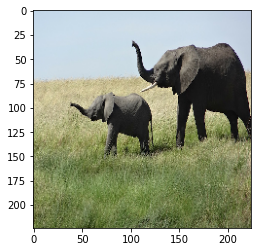

In [29]:
IMG_PATH = './resources/creative_commons_elephant.jpg'

model = VGG16(weights='imagenet')
img = image.load_img(IMG_PATH, target_size=(224, 224))
x = image.img_to_array(img)
x = np.expand_dims(x, axis=0)

input_img = x / 255
plt.imshow(input_img[0])
plt.show()

Running a prediction with the input image above and decoding it in a readable way, we get:

In [30]:
from tensorflow.keras.applications.vgg16 import decode_predictions

x = preprocess_input(x)

preds = model.predict(x)
print(f"Predicted: {decode_predictions(preds, top=3)[0]}")

Predicted: [('n02504458', 'African_elephant', 0.909421), ('n01871265', 'tusker', 0.086182885), ('n02504013', 'Indian_elephant', 0.0043545826)]


We got the top 3 classes, and the entry in the prediction vector that has been maximally activated is the one corresponding to the `African_elephant` class, at index 386 (see below)

In [31]:
np.argmax(preds[0])

386

In order to visualize which parts of the image are most "African elephant-like", we have to setup a Grad-CAM process. Tensorflow 2 allows to do that through **automatic differentiation** and what TensorFlow calls a **gradient tape**, which we have used also for the previous exercise about filter visualization.

Automatic differentiation is the **process of computing a value and computing derivatives of that value**.

TensorFlow 2 provides an implementation of automatic differentiation through what they call gradient tape:

_TensorFlow provides the tf.GradientTape API for automatic differentiation — computing the gradient of a computation with respect to its input variables. TensorFlow “records” all operations executed inside the context of a tf.GradientTape onto a “tape”. TensorFlow then uses that tape and the gradients associated with each recorded operation to compute the gradients of a “recorded” computation using reverse mode differentiation”_.

The gradients are calculated through automatic differentiation. 

In [95]:
import cv2

AFRICAN_ELEPHANT_CLASS_IDX = 386

last_conv_layer = model.get_layer('block5_conv3') # Output feature map of the last conv level of VGG16

# Construct the gradient model by supplying:
# (1) the inputs to our pre-trained model;
# (2) the output of the last convolutional layer in the network;
# (3) the output of the softmax activations from the model
grad_model = tf.keras.models.Model([model.inputs], [last_conv_layer.output, model.output])

# Set up GradientTape for automatic differentiation
with tf.GradientTape() as tape:
    # pass the image through the gradient model, and grab the loss associated with the specific class index
    conv_outputs, predictions = grad_model(x)
    loss = predictions[:, AFRICAN_ELEPHANT_CLASS_IDX]

output = conv_outputs[0]

# Compute the gradients of the "African elephant" class with regard to the output 
# feature map of block5_conv3, given a sample image
grads = tape.gradient(loss, conv_outputs)[0]

# Vector of shape (512), where each entry is the mean intensity of the gradient over a specific feature map channel
weights = tf.reduce_mean(grads, axis=(0, 1))

# Multiplies each channel in feature-map array by "how important this channel is" with regard to the elephant class.
cam = tf.multiply(weights, output)

# The channel-wise mean of the resulting feature map is the heatmap of the class activation!
heatmap = tf.reduce_mean(cam, axis=-1).numpy()

#### Visualize the heatmap

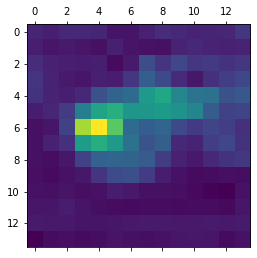

In [96]:
# Postprocessing heatmap
heatmap = (heatmap - np.min(heatmap)) / (heatmap.max() - heatmap.min())

plt.matshow(heatmap)

#### Generate superimposed original image over the heatmap

In [97]:
# Use cv2 to load the original image
cv_img = cv2.imread(IMG_PATH)

# Resize the heatmap to be the same as the original image
heatmap = cv2.resize(heatmap, (cv_img.shape[1], cv_img.shape[0]))

# Converts heatmap to RBG
heatmap = (heatmap * 255).astype(np.uint8)

# Apply a color map to the heatmap
heatmap = cv2.applyColorMap(heatmap, cv2.COLORMAP_JET)

# Applies the heatmap to the original image. The variable alpha is a heatmap intensity factor
alpha = 0.4
output_image = cv2.addWeighted(cv_img, alpha, heatmap, 1 - alpha, 0)

cv2.imwrite('./resources/elephant_cam.jpg', output_image)

True

<img src="./resources/elephant_cam.jpg">

It is interesting to note that the ears of the elephant cub are strongly activated: this is probably how the network can tell the difference between African and Indian elephants.